In [25]:
##### Audio Classification Using Machine Learning
#####dataset url https://urbansounddataset.weebly.com/urbansound8k.html

In [26]:
!pip install librosa

In [27]:
import matplotlib.pyplot as plt
%matplotlib inline

In [28]:
filename='UrbanSound8K/dog_bark.wav'

In [29]:
import IPython.display as ipd
import librosa
import librosa.display

In [30]:
!dir

 Volume in drive C is Windows
 Volume Serial Number is 70EA-5604

 Directory of C:\Users\tejas\Downloads\Audio-Classification-main\Audio-Classification-main

20-05-2025  14:17    <DIR>          .
20-05-2025  13:54    <DIR>          ..
20-05-2025  13:01    <DIR>          .ipynb_checkpoints
20-05-2025  14:17         6,658,446 Audio Classification EDA.ipynb
20-05-2025  12:58            35,149 LICENSE
20-05-2025  12:58           151,197 Part 2- Audio Classification Data Preprocessing And Model Creation.ipynb
20-05-2025  12:58           146,754 Part 2- Audio Classification Data Preprocessing.ipynb
20-05-2025  12:58                22 README.md
20-05-2025  13:50    <DIR>          UrbanSound8K
               5 File(s)      6,991,568 bytes
               4 Dir(s)  242,415,898,624 bytes free


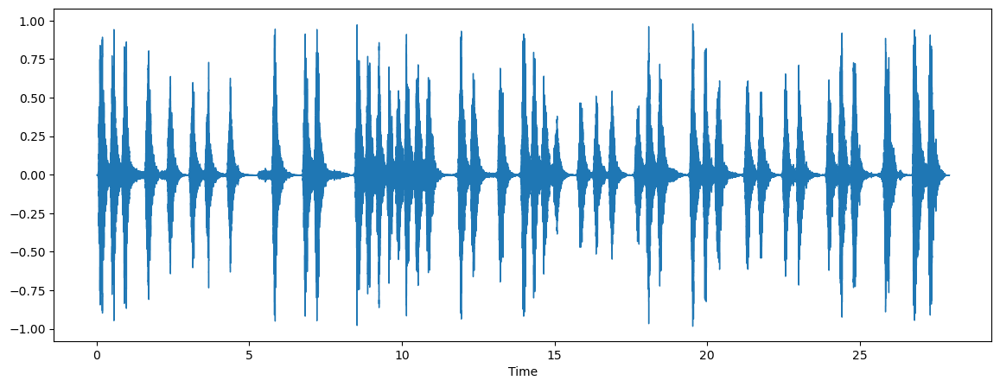

In [31]:
### Dog Sound
plt.figure(figsize=(14,5))
data,sample_rate=librosa.load(filename)
librosa.display.waveshow(data,sr=sample_rate)
ipd.Audio(filename)

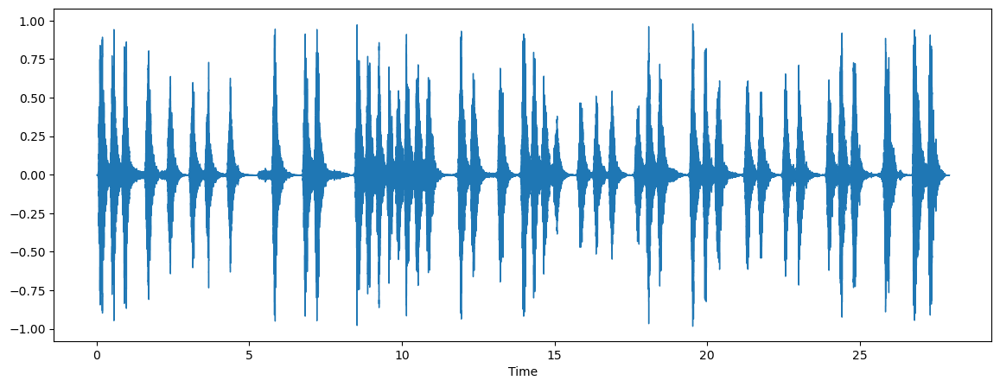

In [32]:
### Sound
filename='UrbanSound8K/dog_bark.wav'
plt.figure(figsize=(14,5))
data,sample_rate=librosa.load(filename)
librosa.display.waveshow(data,sr=sample_rate)
ipd.Audio(filename)

In [33]:
sample_rate


22050

In [34]:
from scipy.io import wavfile as wav
wave_sample_rate, wave_audio=wav.read(filename)

In [35]:
wave_sample_rate

44100

In [36]:
wave_audio

array([[0, 0],
       [0, 0],
       [0, 0],
       ...,
       [0, 0],
       [0, 0],
       [0, 0]], dtype=int16)

In [37]:
data

array([ 9.3132257e-10,  1.1641532e-09,  2.3283064e-10, ...,
        0.0000000e+00,  4.7748472e-12, -4.5474735e-13], dtype=float32)

In [39]:
### Check whether the dataset is imbalanced
metadata['class'].value_counts()

class
dog_bark            1000
children_playing    1000
air_conditioner     1000
street_music        1000
engine_idling       1000
jackhammer          1000
drilling            1000
siren                929
car_horn             429
gun_shot             374
Name: count, dtype: int64

In [38]:
import pandas as pd

metadata=pd.read_csv('UrbanSound8K/metadata/UrbanSound8K.csv')
metadata.head(10)

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.000000,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.500000,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.500000,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.000000,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.500000,72.500000,1,5,2,children_playing
5,100263-2-0-143.wav,100263,71.500000,75.500000,1,5,2,children_playing
6,100263-2-0-161.wav,100263,80.500000,84.500000,1,5,2,children_playing
7,100263-2-0-3.wav,100263,1.500000,5.500000,1,5,2,children_playing
8,100263-2-0-36.wav,100263,18.000000,22.000000,1,5,2,children_playing
9,100648-1-0-0.wav,100648,4.823402,5.471927,2,10,1,car_horn


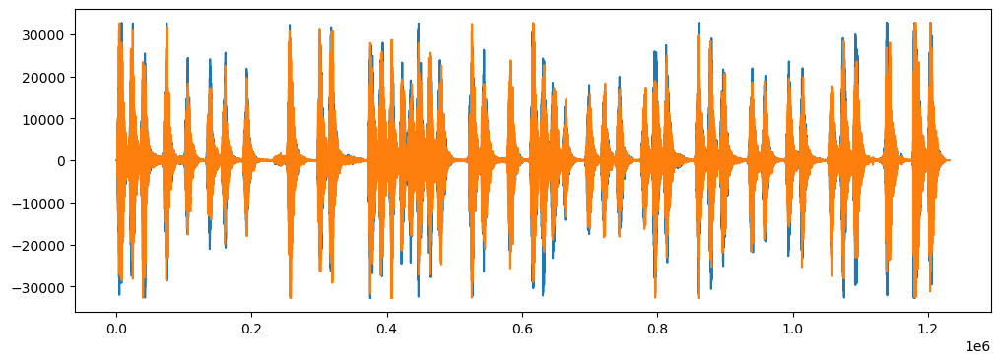

In [40]:
import matplotlib.pyplot as plt

#Original audio with 2 channels
plt.figure(figsize=(12,4))
plt.plot(wave_audio)

In [42]:
mfccs = librosa.feature.mfcc(y=data, sr=sample_rate, n_mfcc=40)
print(mfccs.shape)


(40, 1203)


In [43]:
mfccs

array([[-5.1537878e+02, -3.9746579e+02, -2.2763811e+02, ...,
        -5.2278851e+02, -5.2278851e+02, -5.2278851e+02],
       [ 9.4218893e+00,  1.2484096e+02,  1.6693658e+02, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 6.4934387e+00,  3.1732334e+01, -4.0096184e+01, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       ...,
       [ 2.0872341e-01, -2.1158681e+00, -3.7902005e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 5.2676213e-01, -1.9376439e-01, -5.9365244e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 5.9447980e-01,  8.1189060e-01, -3.7323968e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00]], dtype=float32)

In [44]:
### Extracting MFCC's For every audio file
import pandas as pd
import os
import librosa

audio_dataset_path='UrbanSound8K/audio/'
metadata=pd.read_csv('UrbanSound8K/metadata/UrbanSound8K.csv')
metadata.head()


,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


In [2]:
!pip install resampy


In [4]:
import pandas as pd

# Replace the path below with the correct path to your metadata file
metadata = pd.read_csv("C:/Users/tejas/Downloads/Audio-Classification-main/Audio-Classification-main/UrbanSound8K/metadata/UrbanSound8K.csv")



In [5]:
def features_extractor(file):
    audio, sample_rate = librosa.load(file, res_type='kaiser_fast')
    mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
    mfccs_scaled_features = np.mean(mfccs.T, axis=0)
    return mfccs_scaled_features


In [8]:
import numpy as np
import librosa

def features_extractor(file):
    audio, sample_rate = librosa.load(file, res_type='kaiser_fast')
    mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
    mfccs_scaled_features = np.mean(mfccs.T, axis=0)
    return mfccs_scaled_features


In [9]:
from tqdm import tqdm
import os
import pandas as pd

# Set the correct paths
metadata_path = r"C:\Users\tejas\Downloads\Audio-Classification-main\Audio-Classification-main\UrbanSound8K\metadata\UrbanSound8K.csv"
audio_dataset_path = r"C:\Users\tejas\Downloads\Audio-Classification-main\Audio-Classification-main\UrbanSound8K\audio"

# Load metadata
metadata = pd.read_csv(metadata_path)

# Feature extraction loop
extracted_features = []

for index_num, row in tqdm(metadata.iterrows(), total=len(metadata)):
    file_name = os.path.join(audio_dataset_path, 'fold'+str(row["fold"]), str(row["slice_file_name"]))
    final_class_labels = row["class"]
    data = features_extractor(file_name)
    extracted_features.append([data, final_class_labels])



  0%|                                                                                         | 0/8732 [00:00<?, ?it/s]C:\Users\tejas\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,
 41%|███████████████████████████████▋                                              | 3554/8732 [02:21<03:26, 25.06it/s]C:\Users\tejas\anaconda3\Lib\site-packages\librosa\core\spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1323
  warnings.warn(
 95%|██████████████████████████████████████████████████████████████████████████▎   | 8326/8732 [05:27<00:15, 25.46it/s]C:\Users\tejas\anaconda3\Lib\site-packages\librosa\core\spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1103
  warnings.warn(
C:\Users\tejas\anaconda3\Lib\site-packages\librosa\core\spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1523
  warnings.warn(
100

In [11]:
# converting extracted_features to pandas dataframe
extracted_features_df = pd.DataFrame(extracted_features, columns=['feature', 'class'])

# display first few rows
extracted_features_df.head()


,feature,class
0,"[-217.35526, 70.22339, -130.38527, -53.282898,...",dog_bark
1,"[-424.09818, 109.34077, -52.919525, 60.86475, ...",children_playing
2,"[-458.79114, 121.38419, -46.520657, 52.00812, ...",children_playing
3,"[-413.89984, 101.66371, -35.42945, 53.036354, ...",children_playing
4,"[-446.60352, 113.68541, -52.402214, 60.302044,...",children_playing


In [13]:
# Split the dataset into independent (X) and dependent (y) variables
X = np.array(extracted_features_df['feature'].tolist())
y = np.array(extracted_features_df['class'].tolist())


In [14]:
# Check the shape of X
X.shape


(8732, 40)

In [15]:
# Check the shape of y
y.shape


(8732,)

In [18]:
### Label Encoding
y=np.array(pd.get_dummies(y))

In [19]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)


In [23]:
print(X_train)

[[-1.31104706e+02  1.12505905e+02 -2.25746956e+01 ...  3.24665213e+00
  -1.36902368e+00  2.75575471e+00]
 [-1.36703424e+01  9.10850830e+01 -7.79273367e+00 ... -3.25305033e+00
  -5.27745295e+00 -1.55697155e+00]
 [-4.98715439e+01  2.65352994e-01 -2.05009365e+01 ...  2.85459447e+00
  -1.60920441e+00  3.52480578e+00]
 ...
 [-4.27012360e+02  9.26230469e+01  3.12939739e+00 ...  7.42641211e-01
   7.33490884e-01  7.11009145e-01]
 [-1.45754608e+02  1.36265778e+02 -3.35155182e+01 ...  1.46811938e+00
  -2.00917006e+00 -8.82181883e-01]
 [-4.21031342e+02  2.10654541e+02  3.49066091e+00 ... -5.38886690e+00
  -3.37136054e+00 -1.56651139e+00]]


In [24]:
print(y)

[[False False False ... False False False]
 [False False  True ... False False False]
 [False False  True ... False False False]
 ...
 [False  True False ... False False False]
 [False  True False ... False False False]
 [False  True False ... False False False]]


In [20]:
print(X_train.shape)


(6985, 40)


In [22]:
print(X_test.shape)

(1747, 40)


In [21]:
print(y_train.shape)

(6985, 10)


In [26]:
import tensorflow as tf 
print(tf.__version__)

2.19.0


In [39]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.optimizers import Adam
from sklearn import metrics
import numpy as np



In [40]:
### No of classes
num_labels = len(np.unique(y))


In [41]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input

model = Sequential()

# Add an explicit Input layer with shape matching your feature size
model.add(Input(shape=(X_train.shape[1],)))

# Now add Dense layers without input_shape argument
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.3))

# Output layer
model.add(Dense(num_labels, activation='softmax'))


In [ ]:
model=Sequential()
###first Layer
model.add(Dense(100,input_shape=(40,)))
model.add(Activation('relu'))
model.add(Dropout(0.5))
###second Layer
model.add(Dense(200))
model.add(Activation('relu'))
model.add(Dropout(0.5))
###third Layer
model.add(Dense(100))
model.add(Activation('relu'))
model.add(Dropout(0.5))

###final Layer
model.add(Dense(num_lables))
model.add(Activation('softmax'))



In [42]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6 (Dense)                      │ (None, 256)                 │          10,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 43,650 (170.51 KB)

 Trainable params: 43,650 (170.51 KB)

 Non-trainable params: 0 (0.00 B)

In [47]:
model.compile(loss='categorical_crossentropy',metrics=['accuracy'],optimizer='adam')

In [67]:
from tensorflow.keras.callbacks import ModelCheckpoint
from datetime import datetime

model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')

num_epochs = 100
num_batch_size = 32

checkpointer = ModelCheckpoint(filepath='saved_models/audio_classification.keras',
                               verbose=1, save_best_only=True)

start = datetime.now()

model.fit(X_train, y_train,
          batch_size=num_batch_size,
          epochs=num_epochs,
          validation_data=(X_test, y_test),
          callbacks=[checkpointer])

duration = datetime.now() - start
print("Training completed in time: ", duration)


Epoch 1/100
210/219 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8064 - loss: 0.5820
Epoch 1: val_loss improved from inf to 0.45819, saving model to saved_models/audio_classification.keras
219/219 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8061 - loss: 0.5833 - val_accuracy: 0.8552 - val_loss: 0.4582
Epoch 2/100
204/219 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8024 - loss: 0.5991
Epoch 2: val_loss did not improve from 0.45819
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8024 - loss: 0.5990 - val_accuracy: 0.8546 - val_loss: 0.4658
Epoch 3/100
210/219 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8034 - loss: 0.5844
Epoch 3: val_loss did not improve from 0.45819
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8034 - loss: 0.5848 - val_accuracy: 0.8495 - val_loss: 0.4881
Epoch 4/100
211/219 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8121 - loss: 0.5648
Epoch 4: val_loss did not improve from 0.45819
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8

In [68]:
test_accuracy=model.evaluate(X_test,y_test,verbose=0)
print(test_accuracy[1])

0.8643388748168945


In [69]:
import numpy as np

filename = "UrbanSound8k/99812-1-1-0.wav"
prediction_feature = features_extractor(filename)
prediction_feature = prediction_feature.reshape(1, -1)

# Predict class
predicted_class = np.argmax(model.predict(prediction_feature), axis=1)

# Force output as a proper numpy array
print(np.array(predicted_class))

      

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
[1]


In [70]:
metadata['class'].unique()

array(['dog_bark', 'children_playing', 'car_horn', 'air_conditioner',
       'street_music', 'gun_shot', 'siren', 'engine_idling', 'jackhammer',
       'drilling'], dtype=object)

In [71]:
class_labels = np.array([
    'air_conditioner', 'car_horn', 'children_playing', 'dog_bark', 
    'drilling', 'engine_idling', 'gun_shot', 'jackhammer', 
    'siren', 'street_music'
])


In [74]:
import librosa
import numpy as np

def features_extractor(file):
    audio, sample_rate = librosa.load(file, res_type='kaiser_fast')
    mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
    mfccs_scaled = np.mean(mfccs.T, axis=0)
    return mfccs_scaled


In [75]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

model = Sequential()
model.add(Dense(256, input_shape=(40,), activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(10, activation='softmax'))  # 10 classes for UrbanSound8K


In [76]:
from tensorflow.keras.callbacks import ModelCheckpoint
from datetime import datetime

model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')

num_epochs = 100
num_batch_size = 32

checkpointer = ModelCheckpoint(filepath='saved_models/audio_classification.keras',
                               verbose=1, save_best_only=True)

start = datetime.now()

model.fit(X_train, y_train,
          batch_size=num_batch_size,
          epochs=num_epochs,
          validation_data=(X_test, y_test),
          callbacks=[checkpointer])

duration = datetime.now() - start
print("Training completed in time: ", duration)


Epoch 1/100
206/219 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1301 - loss: 17.6023
Epoch 1: val_loss improved from inf to 2.25624, saving model to saved_models/audio_classification.keras
219/219 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1302 - loss: 16.9749 - val_accuracy: 0.1420 - val_loss: 2.2562
Epoch 2/100
207/219 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1658 - loss: 2.3321
Epoch 2: val_loss improved from 2.25624 to 2.13951, saving model to saved_models/audio_classification.keras
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1661 - loss: 2.3299 - val_accuracy: 0.1878 - val_loss: 2.1395
Epoch 3/100
207/219 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1792 - loss: 2.2173
Epoch 3: val_loss improved from 2.13951 to 2.11176, saving model to saved_models/audio_classification.keras
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1790 - loss: 2.2173 - val_accuracy: 0.1843 - val_loss: 2.1118
Epoch 4/100
199/219 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0

In [77]:
import numpy as np

class_labels = np.array([
    'air_conditioner', 'car_horn', 'children_playing', 'dog_bark', 
    'drilling', 'engine_idling', 'gun_shot', 'jackhammer', 
    'siren', 'street_music'
])

filename = "UrbanSound8k/99812-1-1-0.wav"  # car_horn
prediction_feature = features_extractor(filename)
prediction_feature = prediction_feature.reshape(1, -1)

# Predict class
predicted_index = np.argmax(model.predict(prediction_feature), axis=1)[0]

# Print predicted label
print("Predicted class index:", predicted_index)
print("Predicted label:", class_labels[predicted_index])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
Predicted class index: 1
Predicted label: car_horn


In [79]:
import numpy as np

class_labels = np.array([
    'air_conditioner', 'car_horn', 'children_playing', 'dog_bark', 
    'drilling', 'engine_idling', 'gun_shot', 'jackhammer', 
    'siren', 'street_music'
])

filename = "UrbanSound8k/97331-2-0-98.wav"  
prediction_feature = features_extractor(filename)
prediction_feature = prediction_feature.reshape(1, -1)

# Predict class
predicted_index = np.argmax(model.predict(prediction_feature), axis=1)[0]

# Print predicted label
print("Predicted class index:", predicted_index)
print("Predicted label:", class_labels[predicted_index])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Predicted class index: 2
Predicted label: children_playing
